In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
data = pd.read_csv('../data/diamonds_train.csv')

In [4]:
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75
2,0.71,Fair,G,VS1,65.5,55.0,2686,5.62,5.53,3.65
3,0.41,Good,D,SI1,63.8,56.0,738,4.68,4.72,3.00
4,1.02,Ideal,G,SI1,60.5,59.0,4882,6.55,6.51,3.95


In [5]:
data.shape

(40455, 10)

In [9]:
x_filter = data['x']==0
y_filter = data['y']==0
z_filter = data['z']==0

data.drop(data[(x_filter | y_filter | z_filter)].index, inplace=True)

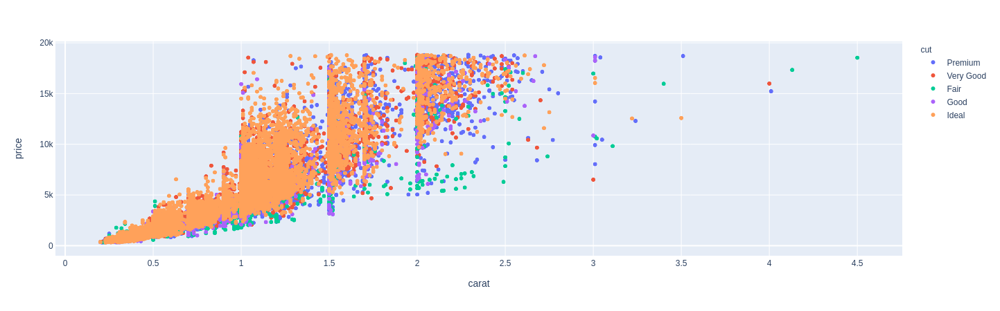

In [24]:
px.scatter(data, x='carat', y='price', color='cut')

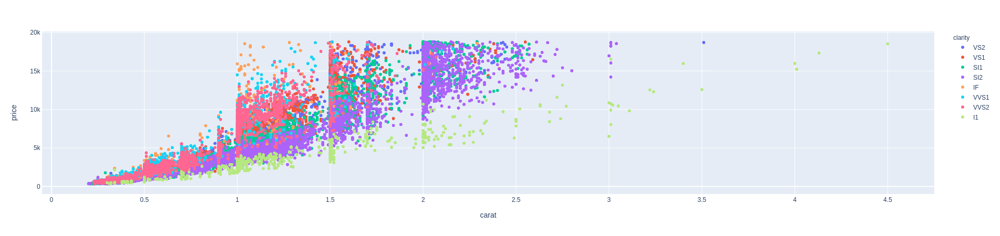

In [25]:
px.scatter(data, x='carat', y='price', color='clarity')

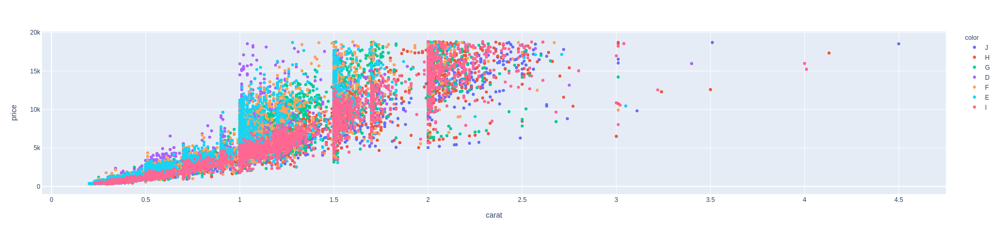

In [26]:
px.scatter(data, x='carat', y='price', color='color')

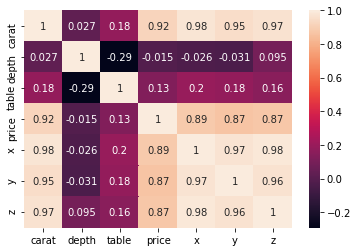

In [25]:
sns.heatmap(data.corr(), annot=True)

In [8]:
cut_color = data[['color', 'cut', 'price']].pivot_table(index='color', columns='cut', aggfunc='mean')
cut_color.columns = cut_color.columns.droplevel(0)
cut_color = cut_color[['Fair', 'Good', 'Very Good', 'Ideal', 'Premium']]

In [22]:
cut_clarity = data[['clarity', 'cut', 'price']].pivot_table(index='clarity', columns='cut', aggfunc='mean')
cut_clarity.columns = cut_clarity.columns.droplevel(0)
cut_clarity.reindex(['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1'])
cut_clarity = cut_clarity[['Fair', 'Good', 'Very Good', 'Ideal', 'Premium']]

In [23]:
color_clarity = data[['clarity', 'color', 'price']].pivot_table(index='color', columns='clarity', aggfunc='mean')
color_clarity.columns = color_clarity.columns.droplevel(0)
color_clarity = color_clarity[['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1']]

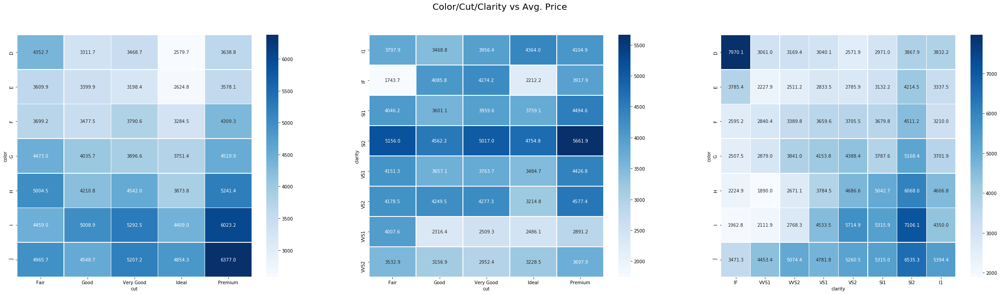

In [24]:
fig, axes = plt.subplots(ncols=3, nrows =1, figsize = (40,10))
fig.suptitle('Color/Cut/Clarity vs Avg. Price', fontsize= 20)

sns.heatmap(cut_color, annot=True, fmt='.1f', ax=axes[0], cmap='Blues',linewidths=.5)
sns.heatmap(cut_clarity, annot=True, fmt='.1f', ax=axes[1], cmap='Blues',linewidths=.5)
sns.heatmap(color_clarity, annot=True, fmt='.1f', ax=axes[2], cmap='Blues',linewidths=.5);

In [183]:
carat_color = data[['color', 'carat', 'price']].pivot_table(index='color', columns='carat', aggfunc='mean')
carat_color.columns = carat_color.columns.droplevel(0)
# carat_color = cut_color[['Fair', 'Good', 'Very Good', 'Ideal', 'Premium']]

carat_color

carat,0.20,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,...,3.11,3.22,3.24,3.40,3.50,3.51,4.00,4.01,4.13,4.50
color,,,,,,,,,,,,,,,,,,,,,
D,367.0,386.0,404.0,504.939394,520.476190,496.277778,567.428571,623.190476,633.200000,643.200000,...,NaN,NaN,NaN,15964.0,NaN,NaN,NaN,NaN,NaN,NaN
E,361.5,375.6,370.5,497.172043,504.619048,577.211538,598.600000,593.646154,616.480000,643.238095,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F,NaN,NaN,406.0,489.296296,520.107692,584.058824,564.755102,632.272727,619.416667,684.608696,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
G,NaN,NaN,NaN,457.800000,492.588235,517.720000,498.925926,522.000000,513.875000,577.322581,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H,NaN,NaN,NaN,420.166667,474.000000,467.937500,489.852941,492.111111,499.846154,535.200000,...,NaN,NaN,12300.0,NaN,12587.0,NaN,NaN,NaN,17329.0,NaN
I,NaN,NaN,NaN,414.000000,446.000000,468.333333,445.333333,467.923077,461.000000,397.750000,...,NaN,12545.0,NaN,NaN,NaN,NaN,15984.0,15223.0,NaN,NaN
J,NaN,NaN,NaN,340.000000,432.000000,NaN,NaN,443.000000,375.000000,NaN,...,9823.0,NaN,NaN,NaN,NaN,18701.0,NaN,15223.0,NaN,18531.0


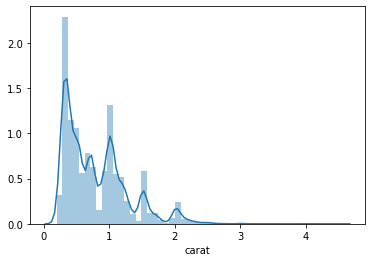

In [26]:
sns.distplot(data['carat'])

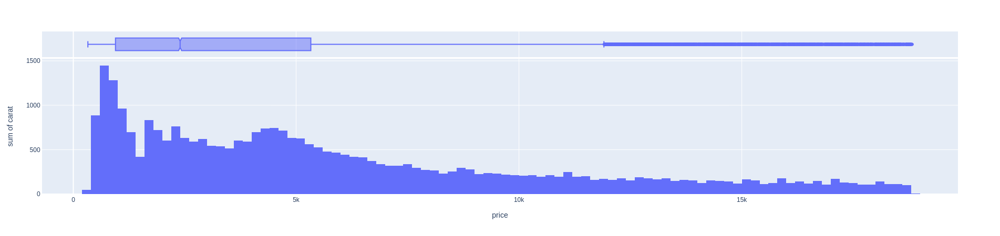

In [28]:
px.histogram(data, x="price", y="carat", marginal="box", hover_data=data.columns)